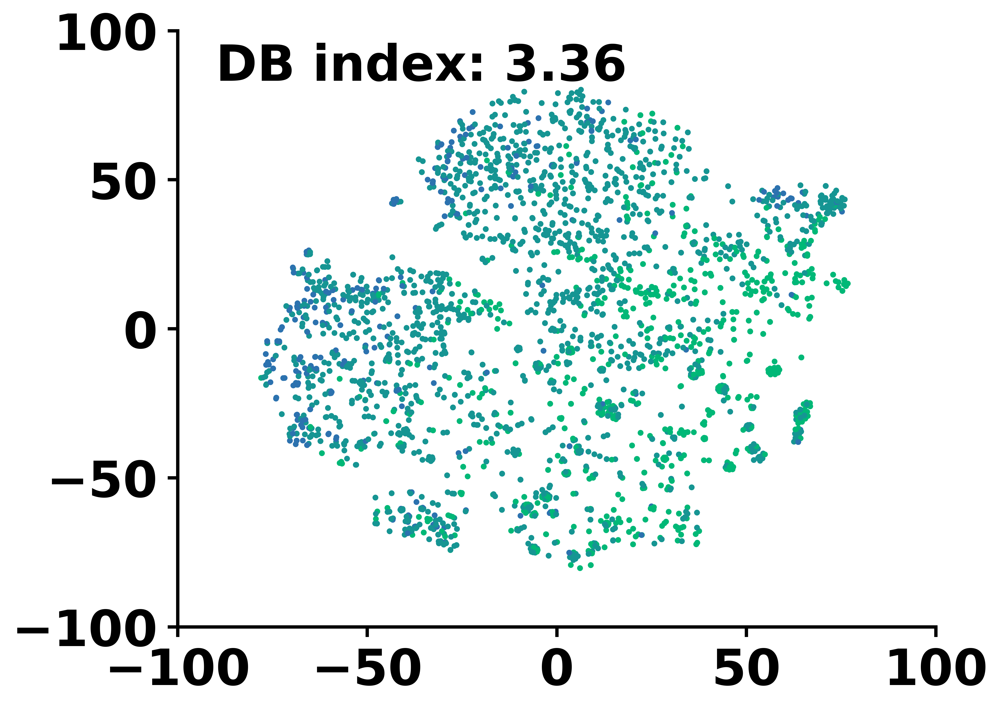

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.metrics import davies_bouldin_score

# 1. 载入数据
smiles_embeddings = np.load('/root/Invertebrates_EC50_multi_fusion/SMILES/smiles_outputs/reg_smiles_cls_embeddings_all.npy')
data = pd.read_excel("/root/fusion_dataset/Invertebrates_EC50_unique.xlsx").dropna()

# ⚠️ 自动对齐长度（取两者的最小值）
min_len = min(len(data), smiles_embeddings.shape[0])
data = data.iloc[:min_len]
smiles_embeddings = smiles_embeddings[:min_len]

mgperL = np.log1p(data['mgperL'].values)

# 2. 生成分类标签
def generate_labels(mg):
    if mg < 1.0:
        return 0  # high
    elif 1.0 <= mg < 5.0:
        return 1  # mid
    elif 5.0 <= mg < 50.0:
        return 2  # mid
    else:
        return 3  # low
        
classification_labels = [generate_labels(mg) for mg in mgperL]

# 3. t-SNE 降维
tsne = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=1000)
tsne_result = tsne.fit_transform(smiles_embeddings)

# 4. DB 指数
dbi_tsne = davies_bouldin_score(tsne_result, classification_labels)

# 5. 绘图
custom_palette = {
    0: "#00B877",  # Jade  — 明亮的绿色
    1: "#169593",  # Dark Cyan — 深青色
    2: "#2C72AF",  # Bice Blue — 中蓝色
    3: "#6D4389",  # Eminence — 紫罗兰色 
}

fig, ax = plt.subplots(figsize=(9, 7), dpi=500)

sns.scatterplot(
    x=tsne_result[:, 0],
    y=tsne_result[:, 1],
    hue=classification_labels,
    palette=custom_palette,
    s=12,
    edgecolor=None,
    linewidth=0,
    ax=ax
)

# DBI 标注：小一点 + 顶部留白后更舒服
ax.text(
    0.05, 0.98,
    f"DB index: {dbi_tsne:.2f}",
    transform=ax.transAxes,
    fontsize=30, fontweight='bold', va='top'
)

ax.legend([], [], frameon=False)

# 关键：刻度别那么大，同时加一点 padding
ax.set_xticks([-100, -50, 0, 50, 100])
ax.set_yticks([-100, -50, 0, 50, 100])
ax.tick_params(axis='both', labelsize=30, width=2, length=6, pad=6)

for t in ax.get_xticklabels() + ax.get_yticklabels():
    t.set_fontweight('bold')

sns.despine(top=True, right=True, ax=ax)
ax.spines['left'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)

# 关键：不要用 tight_layout 把顶部挤爆，给标题留条“天窗”
plt.tight_layout(rect=[0.06, 0.06, 1.00, 0.92])
plt.show()


Graph embeddings 形状: (3213, 256)
row_id_graph 形状: (3213,)
对齐后的标签长度: 3213
Graph 端 t-SNE 空间 DB index: 2.9478


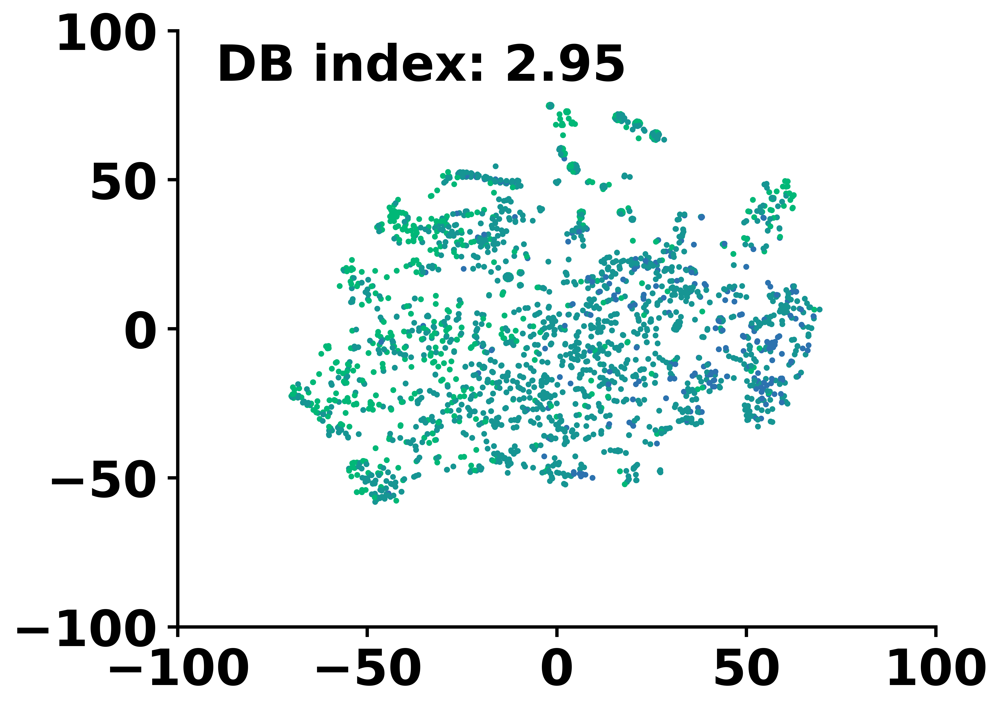

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.metrics import davies_bouldin_score

# ========== 1. 载入 Graph 嵌入 + row_id ==========
# TODO: 按你的实际路径改
graph_embeddings = np.load('/root/Invertebrates_EC50_multi_fusion/graph/graph_outputs/reg_graph_embeddings.npy')
row_id_graph     = np.load('/root/Invertebrates_EC50_multi_fusion/graph/graph_outputs/row_id_graph_for_emb.npy')  # 每个embedding对应df的行号

print("Graph embeddings 形状:", graph_embeddings.shape)
print("row_id_graph 形状:", row_id_graph.shape)

# ========== 2. 载入原始数据，并用 row_id_graph 对齐标签 ==========
# 和 text 端用的是同一个数据表
df = pd.read_excel("/root/fusion_dataset/Invertebrates_EC50_unique.xlsx").dropna()
df = df.reset_index(drop=True)  # 确保行号是 0..N-1，和 row_id_graph 同一个体系

# 这里保持跟你原来文本端一致：先对 mgperL 做 log1p，再分段
mgperL_raw = df["mgperL"].values              # 原始 mg/L
mgperL_log = np.log1p(mgperL_raw)             # log1p(mg/L)

# 用 row_id_graph 对齐，得到每个 graph embedding 对应的 mgperL_log
mgperL_log_graph = mgperL_log[row_id_graph]

def generate_labels(mg):
    # 注意：这里 mg 是 log1p(mg/L)，阈值 1,5,50 也是在 log1p 空间里
    if mg < 1.0:
        return 0  # high
    elif 1.0 <= mg < 5.0:
        return 1  # mid
    elif 5.0 <= mg < 50.0:
        return 2  # mid
    else:
        return 3  # low

classification_labels = np.array([generate_labels(mg) for mg in mgperL_log_graph], dtype=int)

print("对齐后的标签长度:", len(classification_labels))

# 安全检查：长度必须和 graph_embeddings 行数一致
assert graph_embeddings.shape[0] == len(classification_labels), "嵌入和标签长度不一致，请检查 row_id_graph 和 df 对齐！"

# ========== 3. t-SNE 降维 ==========
tsne = TSNE(
    n_components=2,
    random_state=42,
    perplexity=30,
    max_iter=1000
)
tsne_result = tsne.fit_transform(graph_embeddings)

# ========== 4. DB 指数 ==========
dbi_tsne = davies_bouldin_score(tsne_result, classification_labels)
print(f"Graph 端 t-SNE 空间 DB index: {dbi_tsne:.4f}")

# ========== 5. 绘图 ==========
custom_palette = {
    0: "#00B877",  # Jade  — 明亮的绿色
    1: "#169593",  # Dark Cyan — 深青色
    2: "#2C72AF",  # Bice Blue — 中蓝色
    3: "#6D4389",  # Eminence — 紫罗兰色 
}

fig, ax = plt.subplots(figsize=(9, 7), dpi=500)

sns.scatterplot(
    x=tsne_result[:, 0],
    y=tsne_result[:, 1],
    hue=classification_labels,
    palette=custom_palette,
    s=12,
    edgecolor=None,
    linewidth=0,
    ax=ax
)

# DBI 标注：小一点 + 顶部留白后更舒服
ax.text(
    0.05, 0.98,
    f"DB index: {dbi_tsne:.2f}",
    transform=ax.transAxes,
    fontsize=30, fontweight='bold', va='top'
)

ax.legend([], [], frameon=False)

# 关键：刻度别那么大，同时加一点 padding
ax.set_xticks([-100, -50, 0, 50, 100])
ax.set_yticks([-100, -50, 0, 50, 100])
ax.tick_params(axis='both', labelsize=30, width=2, length=6, pad=6)

for t in ax.get_xticklabels() + ax.get_yticklabels():
    t.set_fontweight('bold')

sns.despine(top=True, right=True, ax=ax)
ax.spines['left'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)

# 关键：不要用 tight_layout 把顶部挤爆，给标题留条“天窗”
plt.tight_layout(rect=[0.06, 0.06, 1.00, 0.92])
plt.show()


PhysChem embeddings 形状: (3406, 64)
row_id_phys 形状: (3406,)
对齐后的标签长度: 3406
PhysChem 端 t-SNE 空间 DB index: 5.1493


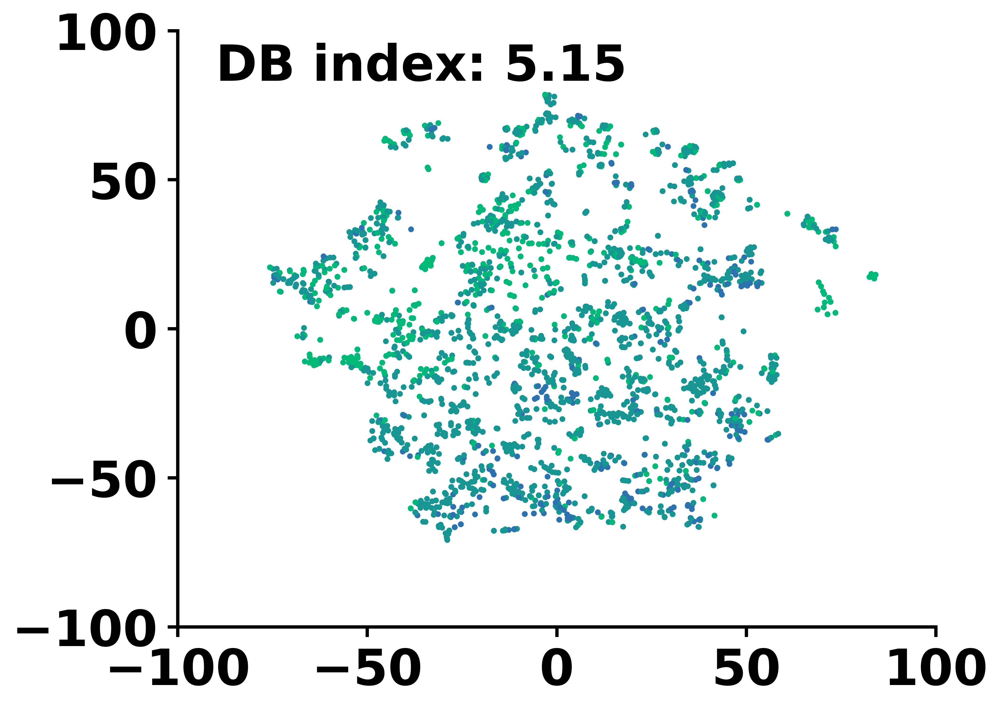

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.metrics import davies_bouldin_score

# ========== 1. 载入 PhysChem Embedding + row_id ==========
PHY_OUT_DIR = "/root/Invertebrates_EC50_multi_fusion/phychem/physchem_mlp_rf_v2"  # TODO: 如有不同自行修改

emb_physchem = np.load(f"{PHY_OUT_DIR}/emb_physchem_mlp_all.npy")   # (N_phys, d)
row_id_phys  = np.load(f"{PHY_OUT_DIR}/row_id_clean.npy")           # (N_phys,) - 对应 df 行号

print("PhysChem embeddings 形状:", emb_physchem.shape)
print("row_id_phys 形状:", row_id_phys.shape)

# ========== 2. 载入原始数据，并用 row_id_phys 对齐标签 ==========
df = pd.read_excel("/root/fusion_dataset/Invertebrates_EC50_unique.xlsx")
df = df.dropna().reset_index(drop=True)   # 保持和你构建 descMLP 时一致的清洗方式

mgperL_raw = df["mgperL"].values           # 原始 mg/L
mgperL_log = np.log1p(mgperL_raw)          # log1p(mg/L)

# 用 row_id_phys 对齐，得到每个 physchem embedding 对应的 mgperL_log
mgperL_log_phys = mgperL_log[row_id_phys]

# 和 Text/Graph 端保持同一套分箱逻辑
def generate_labels(mg):
    # 注意：这里 mg 是 log1p(mg/L)，阈值 1, 5, 50 也是在 log1p 空间里
    if mg < 1.0:
        return 0  # high
    elif 1.0 <= mg < 5.0:
        return 1  # mid
    elif 5.0 <= mg < 50.0:
        return 2  # mid
    else:
        return 3  # low

classification_labels = np.array(
    [generate_labels(mg) for mg in mgperL_log_phys],
    dtype=int
)

print("对齐后的标签长度:", len(classification_labels))

# 安全检查：一行 embedding 必须对应一个标签
assert emb_physchem.shape[0] == len(classification_labels), "嵌入和标签长度不一致，检查 row_id_phys 与 df 的对齐！"

# ========== 3. t-SNE 降维 ==========
tsne = TSNE(
    n_components=2,
    random_state=42,
    perplexity=30,
    max_iter=1000
)
tsne_result = tsne.fit_transform(emb_physchem)

# ========== 4. DB 指数 ==========
dbi_tsne = davies_bouldin_score(tsne_result, classification_labels)
print(f"PhysChem 端 t-SNE 空间 DB index: {dbi_tsne:.4f}")

# ========== 5. 绘图 ==========
custom_palette = {
    0: "#00B877",  # Jade  — 明亮的绿色
    1: "#169593",  # Dark Cyan — 深青色
    2: "#2C72AF",  # Bice Blue — 中蓝色
    3: "#6D4389",  # Eminence — 紫罗兰色 
}

fig, ax = plt.subplots(figsize=(9, 7), dpi=500)

sns.scatterplot(
    x=tsne_result[:, 0],
    y=tsne_result[:, 1],
    hue=classification_labels,
    palette=custom_palette,
    s=12,
    edgecolor=None,
    linewidth=0,
    ax=ax
)

# DBI 标注：小一点 + 顶部留白后更舒服
ax.text(
    0.05, 0.98,
    f"DB index: {dbi_tsne:.2f}",
    transform=ax.transAxes,
    fontsize=30, fontweight='bold', va='top'
)

ax.legend([], [], frameon=False)

# 关键：刻度别那么大，同时加一点 padding
ax.set_xticks([-100, -50, 0, 50, 100])
ax.set_yticks([-100, -50, 0, 50, 100])
ax.tick_params(axis='both', labelsize=30, width=2, length=6, pad=6)

for t in ax.get_xticklabels() + ax.get_yticklabels():
    t.set_fontweight('bold')

sns.despine(top=True, right=True, ax=ax)
ax.spines['left'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)

# 关键：不要用 tight_layout 把顶部挤爆，给标题留条“天窗”
plt.tight_layout(rect=[0.06, 0.06, 1.00, 0.92])
plt.show()


X_all_tg 形状: (3213, 516)
row_id_all_tg 形状: (3213,)
[T+G 早期融合] t-SNE 2D 空间 DB index: 3.2099


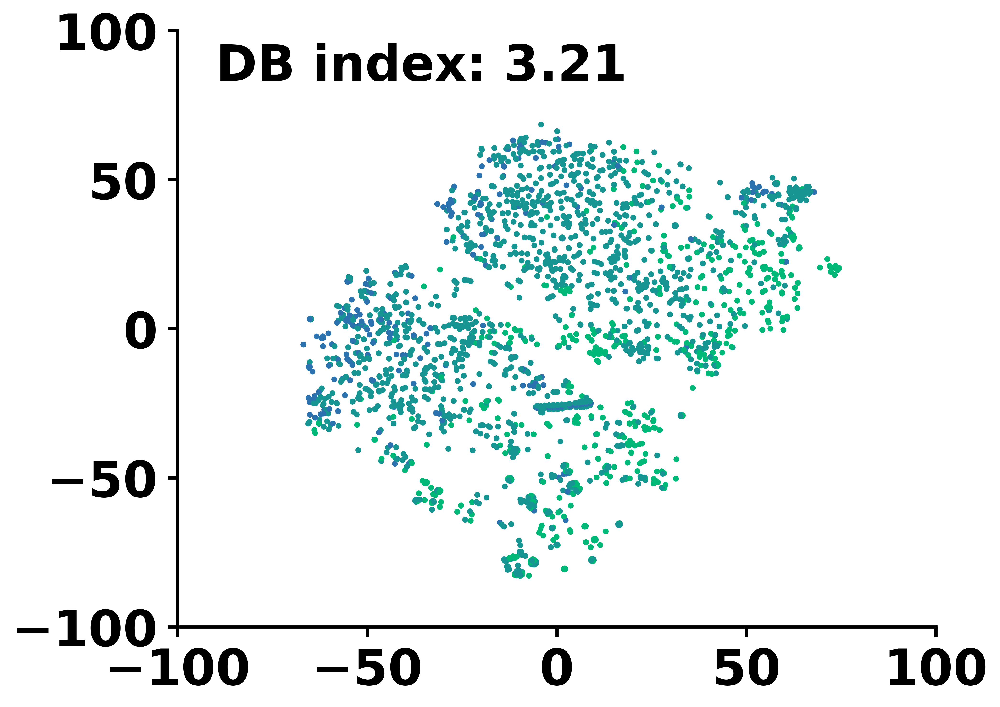

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.metrics import davies_bouldin_score

# ========== 1. 载入 T+G 早期融合后的特征 + row_id ==========
ROOT_MULTI = "/root/Invertebrates_EC50_multi_fusion"  # 按你的项目根目录改
FUSION_DIR = f"{ROOT_MULTI}/early(T+G)/text_plus_graph_simple"

X_all_tg      = np.load(f"{FUSION_DIR}/X_all_tg_fused.npy")   # (N_tg, d_fused)
row_id_all_tg = np.load(f"{FUSION_DIR}/row_id_all_tg.npy")    # (N_tg, )

print("X_all_tg 形状:", X_all_tg.shape)
print("row_id_all_tg 形状:", row_id_all_tg.shape)

# ========== 2. 从原始 df 里按 row_id 对齐标签 ==========
df = pd.read_excel("/root/fusion_dataset/Invertebrates_EC50_unique.xlsx")
df = df.dropna().reset_index(drop=True)

mgperL_raw = df.loc[row_id_all_tg, "mgperL"].values   # 只取交集中这些行
mgperL_log = np.log1p(mgperL_raw)                     # 和前面保持一致：log1p(mg/L)

def generate_labels(mg):
    # mg 是 log1p(mg/L)，阈值一样用 1 / 5 / 50
    if mg < 1.0:
        return 0  # high
    elif 1.0 <= mg < 5.0:
        return 1  # mid
    elif 5.0 <= mg < 50.0:
        return 2  # mid
    else:
        return 3  # low

classification_labels = np.array(
    [generate_labels(mg) for mg in mgperL_log],
    dtype=int
)

assert X_all_tg.shape[0] == len(classification_labels), "特征与标签长度不一致，检查 row_id_all_tg 对齐！"

# ========== 3. t-SNE 降维 ==========
tsne = TSNE(
    n_components=2,
    random_state=42,
    perplexity=30,
    max_iter=1000
)
tsne_result = tsne.fit_transform(X_all_tg)

# ========== 4. DB 指数（在 t-SNE 2D 空间）==========
dbi_tsne = davies_bouldin_score(tsne_result, classification_labels)
print(f"[T+G 早期融合] t-SNE 2D 空间 DB index: {dbi_tsne:.4f}")

# ========== 5. 绘图 ==========
custom_palette = {
    0: "#00B877",  # Jade  — 明亮的绿色
    1: "#169593",  # Dark Cyan — 深青色
    2: "#2C72AF",  # Bice Blue — 中蓝色
    3: "#6D4389",  # Eminence — 紫罗兰色 
}

fig, ax = plt.subplots(figsize=(9, 7), dpi=500)

sns.scatterplot(
    x=tsne_result[:, 0],
    y=tsne_result[:, 1],
    hue=classification_labels,
    palette=custom_palette,
    s=12,
    edgecolor=None,
    linewidth=0,
    ax=ax
)

# DBI 标注：小一点 + 顶部留白后更舒服
ax.text(
    0.05, 0.98,
    f"DB index: {dbi_tsne:.2f}",
    transform=ax.transAxes,
    fontsize=30, fontweight='bold', va='top'
)

ax.legend([], [], frameon=False)

# 关键：刻度别那么大，同时加一点 padding
ax.set_xticks([-100, -50, 0, 50, 100])
ax.set_yticks([-100, -50, 0, 50, 100])
ax.tick_params(axis='both', labelsize=30, width=2, length=6, pad=6)

for t in ax.get_xticklabels() + ax.get_yticklabels():
    t.set_fontweight('bold')

sns.despine(top=True, right=True, ax=ax)
ax.spines['left'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)

# 关键：不要用 tight_layout 把顶部挤爆，给标题留条“天窗”
plt.tight_layout(rect=[0.06, 0.06, 1.00, 0.92])
plt.show()


X_all_tp 形状: (3406, 324)
row_id_all_tp 形状: (3406,)
[T+P 早期融合] t-SNE 2D 空间 DB index: 3.2793


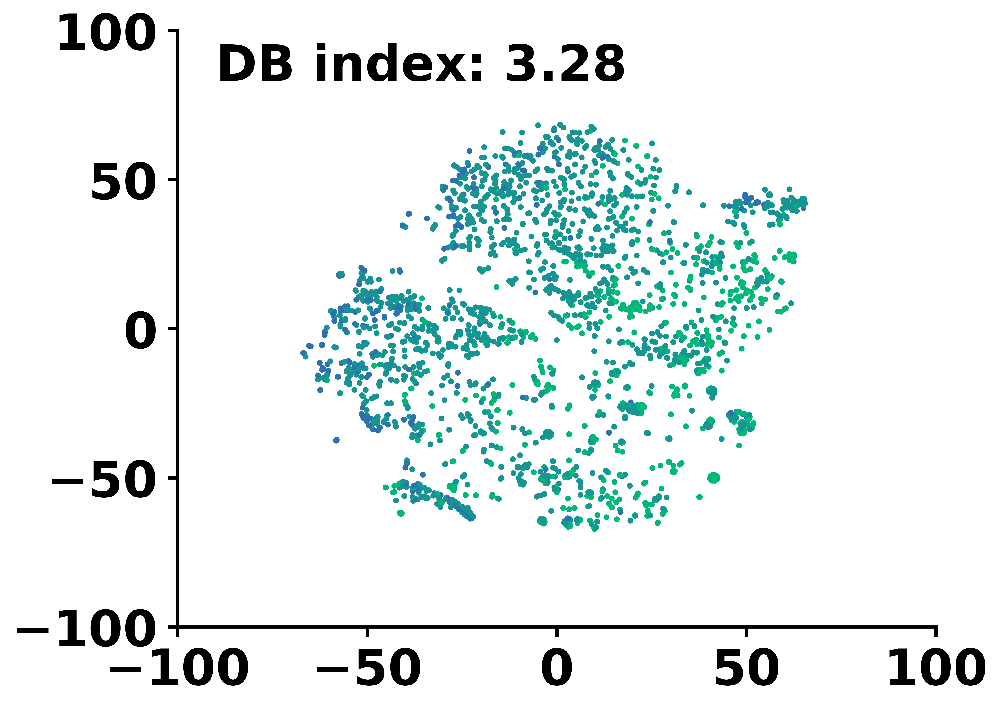

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.metrics import davies_bouldin_score

# ========== 1. 载入 T+P 早期融合后的特征 + row_id ==========
ROOT_MULTI = "/root/Invertebrates_EC50_multi_fusion"  # 按你的项目根目录改
FUSION_DIR = f"{ROOT_MULTI}/early(T+P)/text_plus_physchem_simple"

X_all_tp      = np.load(f"{FUSION_DIR}/X_all_tp_fused.npy")   # (N_tp, d_fused)
row_id_all_tp = np.load(f"{FUSION_DIR}/row_id_all_tp.npy")    # (N_tp, )

print("X_all_tp 形状:", X_all_tp.shape)
print("row_id_all_tp 形状:", row_id_all_tp.shape)

# ========== 2. 从原始 df 里按 row_id 对齐标签 ==========
df = pd.read_excel("/root/fusion_dataset/Invertebrates_EC50_unique.xlsx")
df = df.dropna().reset_index(drop=True)

mgperL_raw = df.loc[row_id_all_tp, "mgperL"].values   # 只取这些行
mgperL_log = np.log1p(mgperL_raw)                     # 和前面保持一致：log1p(mg/L)

def generate_labels(mg):
    # mg 是 log1p(mg/L)，阈值一样用 1 / 5 / 50
    if mg < 1.0:
        return 0  # high
    elif 1.0 <= mg < 5.0:
        return 1  # mid
    elif 5.0 <= mg < 50.0:
        return 2  # mid
    else:
        return 3  # low

classification_labels = np.array(
    [generate_labels(mg) for mg in mgperL_log],
    dtype=int
)

assert X_all_tp.shape[0] == len(classification_labels), "特征与标签长度不一致，检查 row_id_all_tp 对齐！"

# ========== 3. t-SNE 降维 ==========
tsne = TSNE(
    n_components=2,
    random_state=42,
    perplexity=30,
    max_iter=1000
)
tsne_result = tsne.fit_transform(X_all_tp)

# ========== 4. DB 指数（在 t-SNE 2D 空间）==========
dbi_tsne = davies_bouldin_score(tsne_result, classification_labels)
print(f"[T+P 早期融合] t-SNE 2D 空间 DB index: {dbi_tsne:.4f}")

# ========== 5. 绘图 ==========
custom_palette = {
    0: "#00B877",  # Jade  — 明亮的绿色
    1: "#169593",  # Dark Cyan — 深青色
    2: "#2C72AF",  # Bice Blue — 中蓝色
    3: "#6D4389",  # Eminence — 紫罗兰色 
}

fig, ax = plt.subplots(figsize=(9, 7), dpi=500)

sns.scatterplot(
    x=tsne_result[:, 0],
    y=tsne_result[:, 1],
    hue=classification_labels,
    palette=custom_palette,
    s=12,
    edgecolor=None,
    linewidth=0,
    ax=ax
)

# DBI 标注：小一点 + 顶部留白后更舒服
ax.text(
    0.05, 0.98,
    f"DB index: {dbi_tsne:.2f}",
    transform=ax.transAxes,
    fontsize=30, fontweight='bold', va='top'
)

ax.legend([], [], frameon=False)

# 关键：刻度别那么大，同时加一点 padding
ax.set_xticks([-100, -50, 0, 50, 100])
ax.set_yticks([-100, -50, 0, 50, 100])
ax.tick_params(axis='both', labelsize=30, width=2, length=6, pad=6)

for t in ax.get_xticklabels() + ax.get_yticklabels():
    t.set_fontweight('bold')

sns.despine(top=True, right=True, ax=ax)
ax.spines['left'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)

# 关键：不要用 tight_layout 把顶部挤爆，给标题留条“天窗”
plt.tight_layout(rect=[0.06, 0.06, 1.00, 0.92])
plt.show()


X_all_gp 形状: (3103, 324)
row_id_all_gp 形状: (3103,)
[G+P 早期融合] t-SNE 2D 空间 DB index: 4.5515


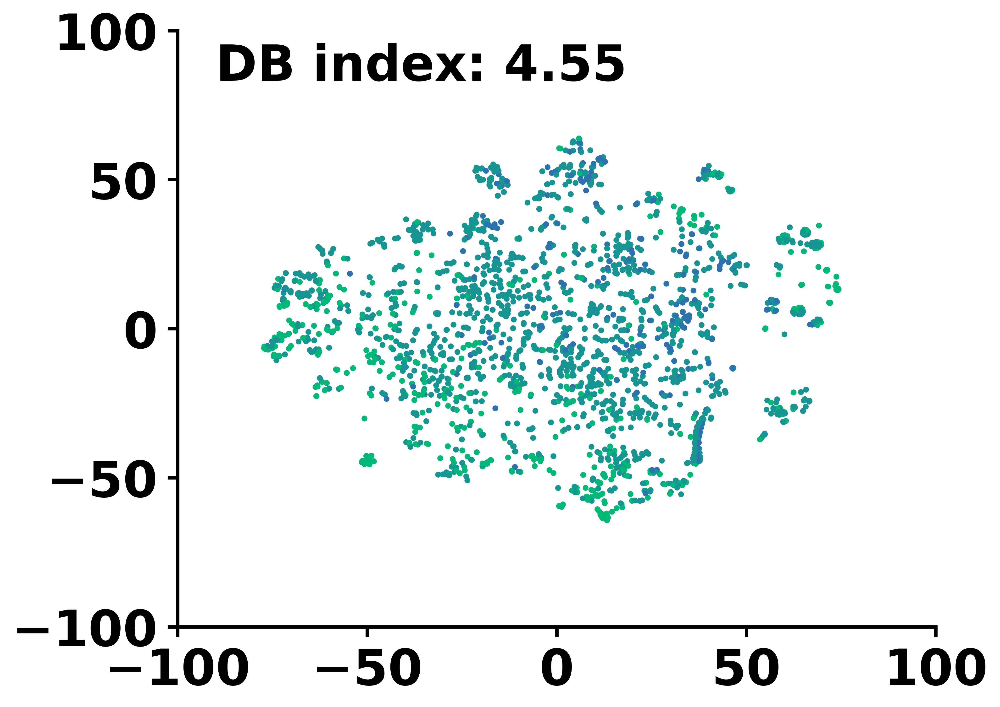

In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.metrics import davies_bouldin_score

# ========== 1. 载入 G+P 早期融合后的特征 + row_id ==========
ROOT_MULTI = "/root/Invertebrates_EC50_multi_fusion"  # 按你的项目根目录改
FUSION_DIR = f"{ROOT_MULTI}/early(G+P)/graph_plus_physchem_simple"  # 如果目录名不同就改这里

X_all_gp      = np.load(f"{FUSION_DIR}/X_all_gp_fused.npy")   # (N_gp, d_fused)
row_id_all_gp = np.load(f"{FUSION_DIR}/row_id_all_gp.npy")    # (N_gp, )

print("X_all_gp 形状:", X_all_gp.shape)
print("row_id_all_gp 形状:", row_id_all_gp.shape)

# ========== 2. 从原始 df 里按 row_id 对齐标签 ==========
df = pd.read_excel("/root/fusion_dataset/Invertebrates_EC50_unique.xlsx")
df = df.dropna().reset_index(drop=True)

mgperL_raw = df.loc[row_id_all_gp, "mgperL"].values   # 只取这些行
mgperL_log = np.log1p(mgperL_raw)                     # 和前面保持一致：log1p(mg/L)

def generate_labels(mg):
    # mg 是 log1p(mg/L)，阈值一样用 1 / 5 / 50
    if mg < 1.0:
        return 0  # high
    elif 1.0 <= mg < 5.0:
        return 1  # mid
    elif 5.0 <= mg < 50.0:
        return 2  # mid
    else:
        return 3  # low

classification_labels = np.array(
    [generate_labels(mg) for mg in mgperL_log],
    dtype=int
)

assert X_all_gp.shape[0] == len(classification_labels), "特征与标签长度不一致，检查 row_id_all_gp 对齐！"

# ========== 3. t-SNE 降维 ==========
tsne = TSNE(
    n_components=2,
    random_state=42,
    perplexity=30,
    max_iter=1000
)
tsne_result = tsne.fit_transform(X_all_gp)

# ========== 4. DB 指数（在 t-SNE 2D 空间）==========
dbi_tsne = davies_bouldin_score(tsne_result, classification_labels)
print(f"[G+P 早期融合] t-SNE 2D 空间 DB index: {dbi_tsne:.4f}")

# ========== 5. 绘图 ==========
custom_palette = {
    0: "#00B877",  # Jade  — 明亮的绿色
    1: "#169593",  # Dark Cyan — 深青色
    2: "#2C72AF",  # Bice Blue — 中蓝色
    3: "#6D4389",  # Eminence — 紫罗兰色 
}

fig, ax = plt.subplots(figsize=(9, 7), dpi=500)

sns.scatterplot(
    x=tsne_result[:, 0],
    y=tsne_result[:, 1],
    hue=classification_labels,
    palette=custom_palette,
    s=12,
    edgecolor=None,
    linewidth=0,
    ax=ax
)

# DBI 标注：小一点 + 顶部留白后更舒服
ax.text(
    0.05, 0.98,
    f"DB index: {dbi_tsne:.2f}",
    transform=ax.transAxes,
    fontsize=30, fontweight='bold', va='top'
)

ax.legend([], [], frameon=False)

# 关键：刻度别那么大，同时加一点 padding
ax.set_xticks([-100, -50, 0, 50, 100])
ax.set_yticks([-100, -50, 0, 50, 100])
ax.tick_params(axis='both', labelsize=30, width=2, length=6, pad=6)

for t in ax.get_xticklabels() + ax.get_yticklabels():
    t.set_fontweight('bold')

sns.despine(top=True, right=True, ax=ax)
ax.spines['left'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)

# 关键：不要用 tight_layout 把顶部挤爆，给标题留条“天窗”
plt.tight_layout(rect=[0.06, 0.06, 1.00, 0.92])
plt.show()


X_all_TGP 形状: (3103, 580)
rowid_all_TGP 形状: (3103,)
[T+G+P 早期融合] t-SNE 2D 空间 DB index: 3.0217


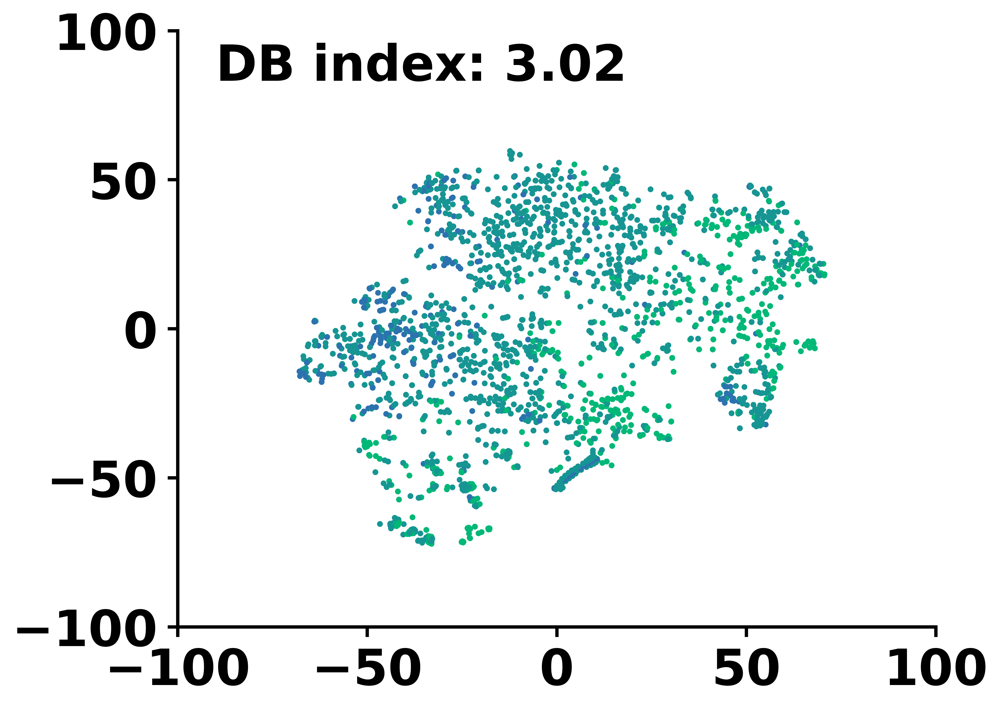

In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.metrics import davies_bouldin_score

# ========== 1. 载入三模态早期融合特征 + row_id ==========

ROOT_MULTI = "/root/Invertebrates_EC50_multi_fusion"  # 项目根目录按需修改
FUSION_DIR = f"{ROOT_MULTI}/early_fusion_TGP"  # ← 按你的实际文件夹名改

X_train_TGP = np.load(f"{FUSION_DIR}/X_train_TGP_early.npy")
X_test_TGP  = np.load(f"{FUSION_DIR}/X_test_TGP_early.npy")

rowid_train_TGP = np.load(f"{FUSION_DIR}/rowid_train_TGP_early.npy")
rowid_test_TGP  = np.load(f"{FUSION_DIR}/rowid_test_TGP_early.npy")

# 拼成“全量”
X_all_TGP      = np.vstack([X_train_TGP, X_test_TGP])
rowid_all_TGP  = np.concatenate([rowid_train_TGP, rowid_test_TGP])

print("X_all_TGP 形状:", X_all_TGP.shape)
print("rowid_all_TGP 形状:", rowid_all_TGP.shape)

# ========== 2. 用 rowid_all_TGP 从原始 df 里取 mgperL，并生成标签 ==========

df = pd.read_excel("/root/fusion_dataset/Invertebrates_EC50_unique.xlsx")
df = df.dropna().reset_index(drop=True)   # 保持和你构建 TGP 早期融合时一致的清洗方式

mgperL_raw = df.loc[rowid_all_TGP, "mgperL"].values   # 只取这些样本
mgperL_log = np.log1p(mgperL_raw)                     # 和前面统一：log1p(mg/L)

def generate_labels(mg):
    # mg 是 log1p(mg/L)，阈值仍然用 1 / 5 / 50
    if mg < 1.0:
        return 0  # high
    elif 1.0 <= mg < 5.0:
        return 1  # mid
    elif 5.0 <= mg < 50.0:
        return 2  # mid
    else:
        return 3  # low

classification_labels = np.array(
    [generate_labels(mg) for mg in mgperL_log],
    dtype=int
)

assert X_all_TGP.shape[0] == len(classification_labels), "特征与标签长度不一致，检查 rowid_all_TGP 对齐！"

# ========== 3. t-SNE 降维 ==========
tsne = TSNE(
    n_components=2,
    random_state=42,
    perplexity=30,
    max_iter=1000
)
tsne_result = tsne.fit_transform(X_all_TGP)

# ========== 4. DBI（在 t-SNE 2D 空间）==========
dbi_tsne = davies_bouldin_score(tsne_result, classification_labels)
print(f"[T+G+P 早期融合] t-SNE 2D 空间 DB index: {dbi_tsne:.4f}")

# ========== 5. 绘图 ==========
custom_palette = {
    0: "#00B877",  # Jade  — 明亮的绿色
    1: "#169593",  # Dark Cyan — 深青色
    2: "#2C72AF",  # Bice Blue — 中蓝色
    3: "#6D4389",  # Eminence — 紫罗兰色 
}

fig, ax = plt.subplots(figsize=(9, 7), dpi=500)

sns.scatterplot(
    x=tsne_result[:, 0],
    y=tsne_result[:, 1],
    hue=classification_labels,
    palette=custom_palette,
    s=12,
    edgecolor=None,
    linewidth=0,
    ax=ax
)

# DBI 标注：小一点 + 顶部留白后更舒服
ax.text(
    0.05, 0.98,
    f"DB index: {dbi_tsne:.2f}",
    transform=ax.transAxes,
    fontsize=30, fontweight='bold', va='top'
)

ax.legend([], [], frameon=False)

# 关键：刻度别那么大，同时加一点 padding
ax.set_xticks([-100, -50, 0, 50, 100])
ax.set_yticks([-100, -50, 0, 50, 100])
ax.tick_params(axis='both', labelsize=30, width=2, length=6, pad=6)

for t in ax.get_xticklabels() + ax.get_yticklabels():
    t.set_fontweight('bold')

sns.despine(top=True, right=True, ax=ax)
ax.spines['left'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)

# 关键：不要用 tight_layout 把顶部挤爆，给标题留条“天窗”
plt.tight_layout(rect=[0.06, 0.06, 1.00, 0.92])
plt.show()


X_all_TG_mid 形状: (3213, 256)
row_id_all_TG 形状: (3213,)
[T+G 中期融合] t-SNE 2D 空间 DB index: 1.8321


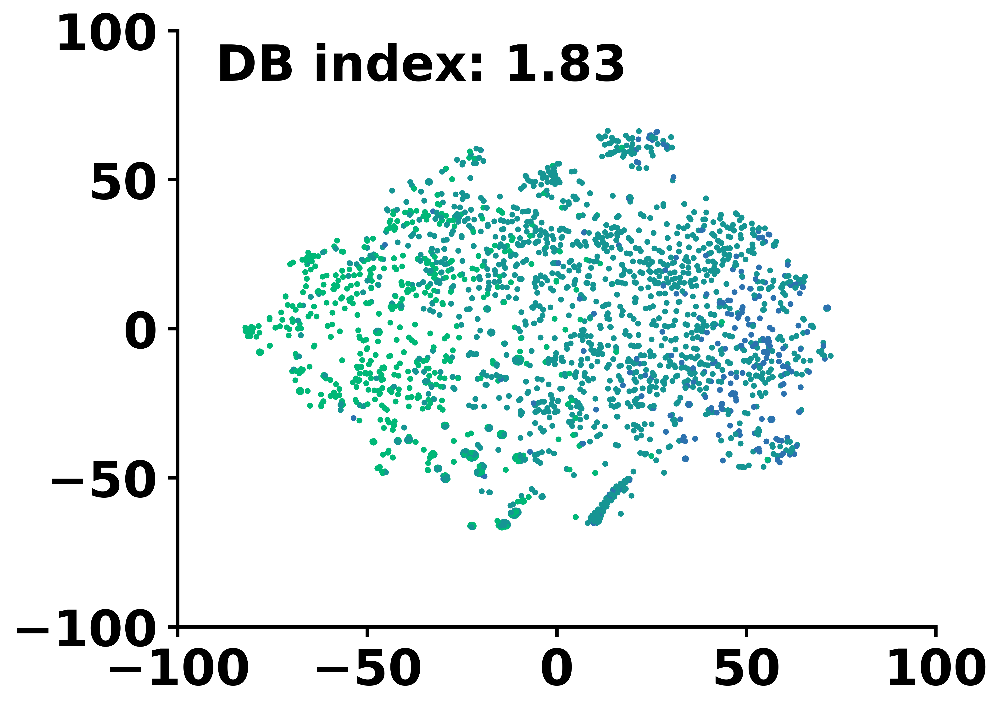

In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.metrics import davies_bouldin_score

# ========== 1. 载入 T+G 中期融合 embedding + row_id ==========

ROOT_MULTI = "/root/Invertebrates_EC50_multi_fusion"  # 按你的项目根目录改
MID_DIR    = f"{ROOT_MULTI}/mid(T+G)/text_graph_meta"  # TODO: 换成你这个文件夹的真实名字

X_all_TG_mid  = np.load(f"{MID_DIR}/fused_all_T_G.npy")     # (N, d_fused)
row_id_all_TG = np.load(f"{MID_DIR}/row_id_all_T_G.npy")    # (N, )

print("X_all_TG_mid 形状:", X_all_TG_mid.shape)
print("row_id_all_TG 形状:", row_id_all_TG.shape)

# ========== 2. 从原始 df 里按 row_id 对齐 mgperL，并生成标签 ==========

df = pd.read_excel("/root/fusion_dataset/Invertebrates_EC50_unique.xlsx")
df = df.dropna().reset_index(drop=True)

mgperL_raw = df.loc[row_id_all_TG, "mgperL"].values
mgperL_log = np.log1p(mgperL_raw)   # 和前面所有 DBI 统一：log1p(mg/L)

def generate_labels(mg):
    # mg 是 log1p(mg/L)，阈值仍用 1 / 5 / 50（在同一空间里比较）
    if mg < 1.0:
        return 0  # high
    elif 1.0 <= mg < 5.0:
        return 1  # mid
    elif 5.0 <= mg < 50.0:
        return 2  # mid
    else:
        return 3  # low

classification_labels = np.array(
    [generate_labels(mg) for mg in mgperL_log],
    dtype=int
)

assert X_all_TG_mid.shape[0] == len(classification_labels), "特征与标签长度不一致，检查 row_id_all_TG 对齐！"

# ========== 3. t-SNE 降维 ==========
tsne = TSNE(
    n_components=2,
    random_state=42,
    perplexity=30,
    max_iter=1000
)
tsne_result = tsne.fit_transform(X_all_TG_mid)

# ========== 4. DBI（t-SNE 2D 空间）==========
dbi_tsne = davies_bouldin_score(tsne_result, classification_labels)
print(f"[T+G 中期融合] t-SNE 2D 空间 DB index: {dbi_tsne:.4f}")

# ========== 5. 绘图 ==========
custom_palette = {
    0: "#00B877",  # Jade  — 明亮的绿色
    1: "#169593",  # Dark Cyan — 深青色
    2: "#2C72AF",  # Bice Blue — 中蓝色
    3: "#6D4389",  # Eminence — 紫罗兰色 
}

fig, ax = plt.subplots(figsize=(9, 7), dpi=500)

sns.scatterplot(
    x=tsne_result[:, 0],
    y=tsne_result[:, 1],
    hue=classification_labels,
    palette=custom_palette,
    s=12,
    edgecolor=None,
    linewidth=0,
    ax=ax
)

# DBI 标注：小一点 + 顶部留白后更舒服
ax.text(
    0.05, 0.98,
    f"DB index: {dbi_tsne:.2f}",
    transform=ax.transAxes,
    fontsize=30, fontweight='bold', va='top'
)

ax.legend([], [], frameon=False)

# 关键：刻度别那么大，同时加一点 padding
ax.set_xticks([-100, -50, 0, 50, 100])
ax.set_yticks([-100, -50, 0, 50, 100])
ax.tick_params(axis='both', labelsize=30, width=2, length=6, pad=6)

for t in ax.get_xticklabels() + ax.get_yticklabels():
    t.set_fontweight('bold')

sns.despine(top=True, right=True, ax=ax)
ax.spines['left'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)

# 关键：不要用 tight_layout 把顶部挤爆，给标题留条“天窗”
plt.tight_layout(rect=[0.06, 0.06, 1.00, 0.92])
plt.show()


X_all_TP_mid 形状: (3406, 256)
row_id_all_TP 形状: (3406,)
[T+P 中期融合] t-SNE 2D 空间 DB index: 1.8822


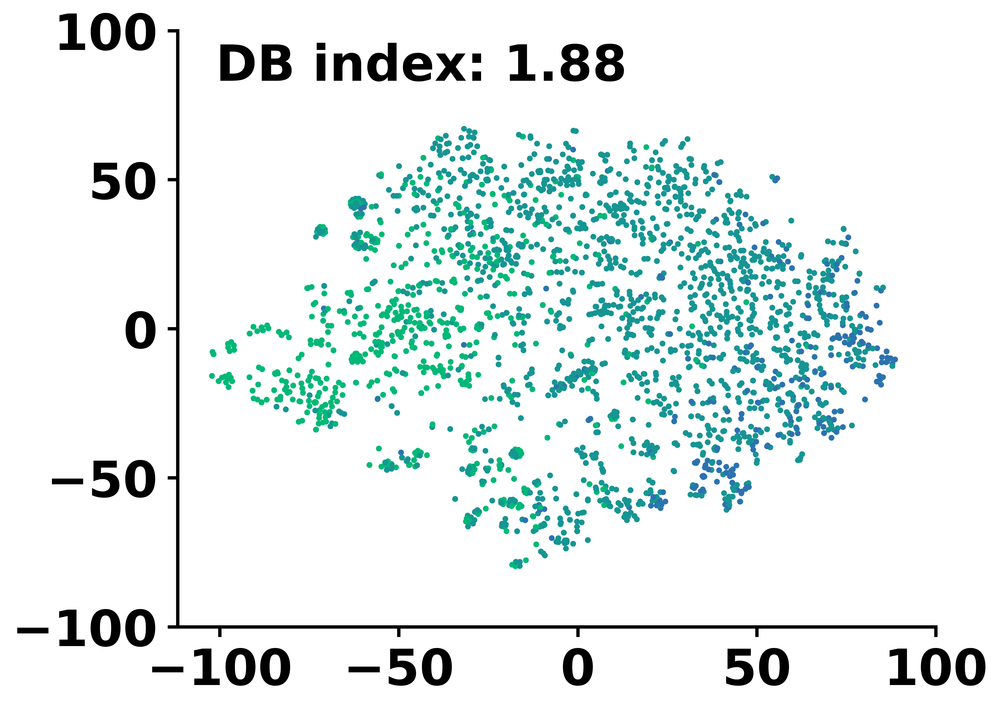

In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.metrics import davies_bouldin_score

# ========== 1. 载入 T+P 中期融合 embedding + row_id ==========

ROOT_MULTI = "/root/Invertebrates_EC50_multi_fusion"   # 项目根目录按需修改
MID_DIR    = f"{ROOT_MULTI}/mid(T+P)/text_physchem_meta"

X_all_TP_mid  = np.load(f"{MID_DIR}/fused_all_T_P.npy")     # (N, d_fused)
row_id_all_TP = np.load(f"{MID_DIR}/row_id_all_T_P.npy")    # (N, )

print("X_all_TP_mid 形状:", X_all_TP_mid.shape)
print("row_id_all_TP 形状:", row_id_all_TP.shape)

# ========== 2. 从原始 df 里按 row_id 对齐 mgperL，并生成标签 ==========

df = pd.read_excel("/root/fusion_dataset/Invertebrates_EC50_unique.xlsx")
df = df.dropna().reset_index(drop=True)

mgperL_raw = df.loc[row_id_all_TP, "mgperL"].values
mgperL_log = np.log1p(mgperL_raw)   # 与前面所有 DBI 保持一致：log1p(mg/L)

def generate_labels(mg):
    # mg 是 log1p(mg/L)，阈值仍用 1 / 5 / 50
    if mg < 1.0:
        return 0  # high
    elif 1.0 <= mg < 5.0:
        return 1  # mid
    elif 5.0 <= mg < 50.0:
        return 2  # mid
    else:
        return 3  # low

classification_labels = np.array(
    [generate_labels(mg) for mg in mgperL_log],
    dtype=int
)

assert X_all_TP_mid.shape[0] == len(classification_labels), "特征与标签长度不一致，检查 row_id_all_T_P 对齐！"

# ========== 3. t-SNE 降维 ==========
tsne = TSNE(
    n_components=2,
    random_state=42,
    perplexity=30,
    max_iter=1000
)
tsne_result = tsne.fit_transform(X_all_TP_mid)

# ========== 4. DBI（t-SNE 2D 空间）==========
dbi_tsne = davies_bouldin_score(tsne_result, classification_labels)
print(f"[T+P 中期融合] t-SNE 2D 空间 DB index: {dbi_tsne:.4f}")

# ========== 5. 绘图 ==========
custom_palette = {
    0: "#00B877",  # Jade  — 明亮的绿色
    1: "#169593",  # Dark Cyan — 深青色
    2: "#2C72AF",  # Bice Blue — 中蓝色
    3: "#6D4389",  # Eminence — 紫罗兰色 
}

fig, ax = plt.subplots(figsize=(9, 7), dpi=500)

sns.scatterplot(
    x=tsne_result[:, 0],
    y=tsne_result[:, 1],
    hue=classification_labels,
    palette=custom_palette,
    s=12,
    edgecolor=None,
    linewidth=0,
    ax=ax
)

# DBI 标注：小一点 + 顶部留白后更舒服
ax.text(
    0.05, 0.98,
    f"DB index: {dbi_tsne:.2f}",
    transform=ax.transAxes,
    fontsize=30, fontweight='bold', va='top'
)

ax.legend([], [], frameon=False)

# 关键：刻度别那么大，同时加一点 padding
ax.set_xticks([-100, -50, 0, 50, 100])
ax.set_yticks([-100, -50, 0, 50, 100])
ax.tick_params(axis='both', labelsize=30, width=2, length=6, pad=6)

for t in ax.get_xticklabels() + ax.get_yticklabels():
    t.set_fontweight('bold')

sns.despine(top=True, right=True, ax=ax)
ax.spines['left'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)

# 关键：不要用 tight_layout 把顶部挤爆，给标题留条“天窗”
plt.tight_layout(rect=[0.06, 0.06, 1.00, 0.92])
plt.show()


X_all_GP_mid 形状: (3103, 256)
row_id_all_GP 形状: (3103,)
[G+P 中期融合] t-SNE 2D 空间 DB index: 2.0404


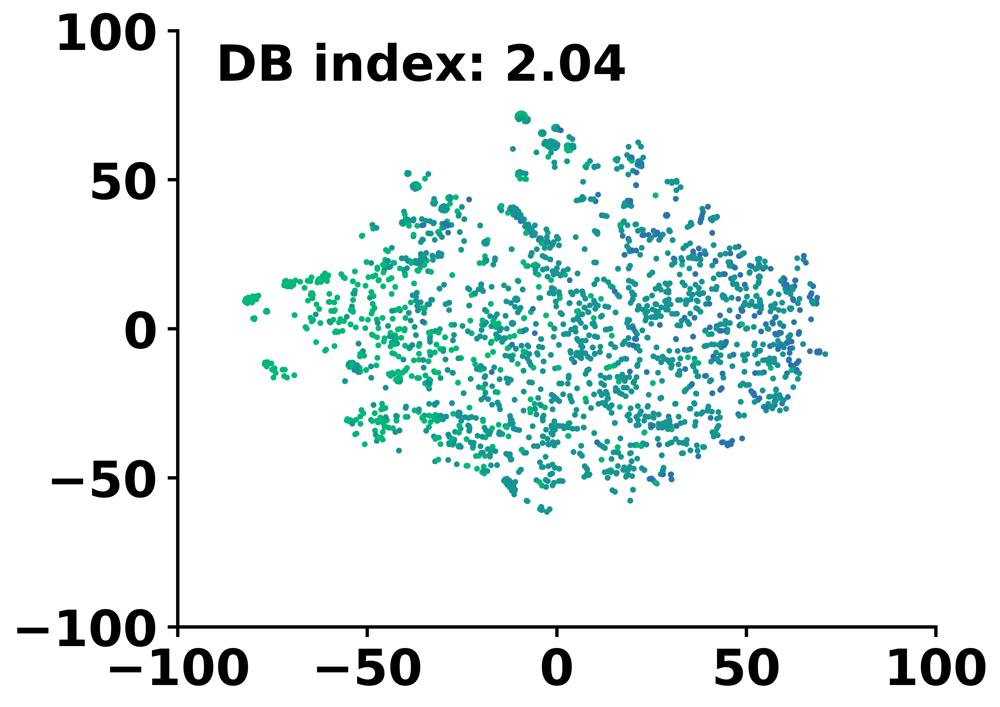

In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.metrics import davies_bouldin_score

# ========== 1. 载入 G+P 中期融合 embedding + row_id ==========

ROOT_MULTI = "/root/Invertebrates_EC50_multi_fusion"   # 按你的项目根目录改
MID_DIR    = f"{ROOT_MULTI}/mid(G+P)/graph_physchem_meta"

X_all_GP_mid  = np.load(f"{MID_DIR}/fused_all_G_P.npy")     # (N, d_fused)
row_id_all_GP = np.load(f"{MID_DIR}/row_id_all_G_P.npy")    # (N, )

print("X_all_GP_mid 形状:", X_all_GP_mid.shape)
print("row_id_all_GP 形状:", row_id_all_GP.shape)

# ========== 2. 从原始 df 里按 row_id 对齐 mgperL，并生成标签 ==========

df = pd.read_excel("/root/fusion_dataset/Invertebrates_EC50_unique.xlsx")
df = df.dropna().reset_index(drop=True)

mgperL_raw = df.loc[row_id_all_GP, "mgperL"].values
mgperL_log = np.log1p(mgperL_raw)   # 和前面所有 DBI 保持一致：log1p(mg/L)

def generate_labels(mg):
    # mg 是 log1p(mg/L)，阈值仍用 1 / 5 / 50
    if mg < 1.0:
        return 0  # high
    elif 1.0 <= mg < 5.0:
        return 1  # mid
    elif 5.0 <= mg < 50.0:
        return 2  # mid
    else:
        return 3  # low

classification_labels = np.array([generate_labels(mg) for mg in mgperL_log],
                                 dtype=int)

assert X_all_GP_mid.shape[0] == len(classification_labels), "特征与标签长度不一致，检查 row_id_all_G_P 对齐！"

# ========== 3. t-SNE 降维 ==========
tsne = TSNE(
    n_components=2,
    random_state=42,
    perplexity=30,
    max_iter=1000
)
tsne_result = tsne.fit_transform(X_all_GP_mid)

# ========== 4. DBI（t-SNE 2D 空间）==========
dbi_tsne = davies_bouldin_score(tsne_result, classification_labels)
print(f"[G+P 中期融合] t-SNE 2D 空间 DB index: {dbi_tsne:.4f}")

# ========== 5. 绘图 ==========
custom_palette = {
    0: "#00B877",  # Jade  — 明亮的绿色
    1: "#169593",  # Dark Cyan — 深青色
    2: "#2C72AF",  # Bice Blue — 中蓝色
    3: "#6D4389",  # Eminence — 紫罗兰色 
}

fig, ax = plt.subplots(figsize=(9, 7), dpi=500)

sns.scatterplot(
    x=tsne_result[:, 0],
    y=tsne_result[:, 1],
    hue=classification_labels,
    palette=custom_palette,
    s=12,
    edgecolor=None,
    linewidth=0,
    ax=ax
)

# DBI 标注：小一点 + 顶部留白后更舒服
ax.text(
    0.05, 0.98,
    f"DB index: {dbi_tsne:.2f}",
    transform=ax.transAxes,
    fontsize=30, fontweight='bold', va='top'
)

ax.legend([], [], frameon=False)

# 关键：刻度别那么大，同时加一点 padding
ax.set_xticks([-100, -50, 0, 50, 100])
ax.set_yticks([-100, -50, 0, 50, 100])
ax.tick_params(axis='both', labelsize=30, width=2, length=6, pad=6)

for t in ax.get_xticklabels() + ax.get_yticklabels():
    t.set_fontweight('bold')

sns.despine(top=True, right=True, ax=ax)
ax.spines['left'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)

# 关键：不要用 tight_layout 把顶部挤爆，给标题留条“天窗”
plt.tight_layout(rect=[0.06, 0.06, 1.00, 0.92])
plt.show()


X_all_TGP_mid 形状: (3103, 256)
rowid_TGP 形状: (3103,)
[T+G+P 中期融合] t-SNE 2D 空间 DB index: 1.2912


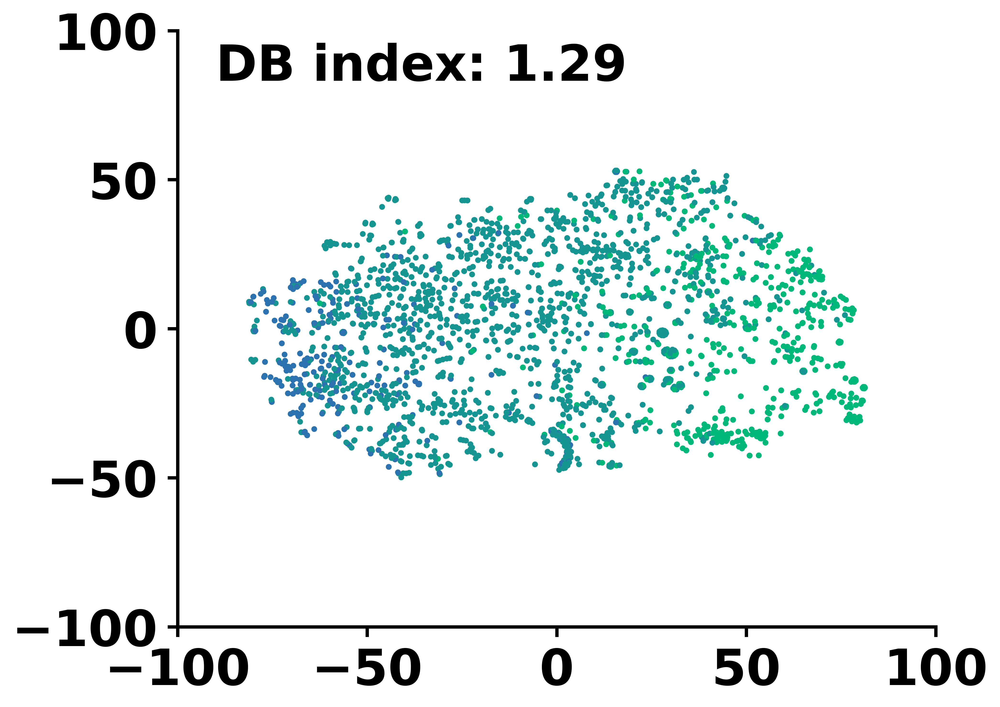

In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.metrics import davies_bouldin_score

# ========== 1. 载入 TGP 中期融合 embedding + row_id ==========

ROOT_MULTI = "/root/Invertebrates_EC50_multi_fusion"   # 按你的实际根目录改
MID_DIR    = f"{ROOT_MULTI}/mid_fusion_TGP"

X_all_TGP_mid = np.load(f"{MID_DIR}/fused_emb_TGP_all.npy")  # (N, d_fused)
rowid_TGP     = np.load(f"{MID_DIR}/rowid_TGP.npy")          # (N,)

print("X_all_TGP_mid 形状:", X_all_TGP_mid.shape)
print("rowid_TGP 形状:", rowid_TGP.shape)

# ========== 2. 从原始 df 里按 rowid 对齐 mgperL，并生成标签 ==========

df = pd.read_excel("/root/fusion_dataset/Invertebrates_EC50_unique.xlsx")
df = df.dropna().reset_index(drop=True)

mgperL_raw = df.loc[rowid_TGP, "mgperL"].values
mgperL_log = np.log1p(mgperL_raw)   # 和前面所有 DBI 一致：log1p(mg/L)

def generate_labels(mg):
    # mg 是 log1p(mg/L)，阈值仍然用 1 / 5 / 50
    if mg < 1.0:
        return 0  # high
    elif 1.0 <= mg < 5.0:
        return 1  # mid
    elif 5.0 <= mg < 50.0:
        return 2  # mid
    else:
        return 3  # low

classification_labels = np.array(
    [generate_labels(mg) for mg in mgperL_log],
    dtype=int
)

assert X_all_TGP_mid.shape[0] == len(classification_labels), "特征与标签长度不一致，检查 rowid_TGP 对齐！"

# ========== 3. t-SNE 降维 ==========
tsne = TSNE(
    n_components=2,
    random_state=42,
    perplexity=30,
    max_iter=1000
)
tsne_result = tsne.fit_transform(X_all_TGP_mid)

# ========== 4. DBI（t-SNE 2D 空间）==========
dbi_tsne = davies_bouldin_score(tsne_result, classification_labels)
print(f"[T+G+P 中期融合] t-SNE 2D 空间 DB index: {dbi_tsne:.4f}")

# ========== 5. 绘图 ==========
custom_palette = {
    0: "#00B877",  # Jade  — 明亮的绿色
    1: "#169593",  # Dark Cyan — 深青色
    2: "#2C72AF",  # Bice Blue — 中蓝色
    3: "#6D4389",  # Eminence — 紫罗兰色 
}

fig, ax = plt.subplots(figsize=(9, 7), dpi=500)

sns.scatterplot(
    x=tsne_result[:, 0],
    y=tsne_result[:, 1],
    hue=classification_labels,
    palette=custom_palette,
    s=12,
    edgecolor=None,
    linewidth=0,
    ax=ax
)

# DBI 标注：小一点 + 顶部留白后更舒服
ax.text(
    0.05, 0.98,
    f"DB index: {dbi_tsne:.2f}",
    transform=ax.transAxes,
    fontsize=30, fontweight='bold', va='top'
)

ax.legend([], [], frameon=False)

# 关键：刻度别那么大，同时加一点 padding
ax.set_xticks([-100, -50, 0, 50, 100])
ax.set_yticks([-100, -50, 0, 50, 100])
ax.tick_params(axis='both', labelsize=30, width=2, length=6, pad=6)

for t in ax.get_xticklabels() + ax.get_yticklabels():
    t.set_fontweight('bold')

sns.despine(top=True, right=True, ax=ax)
ax.spines['left'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)

# 关键：不要用 tight_layout 把顶部挤爆，给标题留条“天窗”
plt.tight_layout(rect=[0.06, 0.06, 1.00, 0.92])
plt.show()


X_all_late 形状: (2204, 2)
rowid_all 形状: (2204,)
[T+G 后期融合] t-SNE 2D 空间 DB index: 2.8627


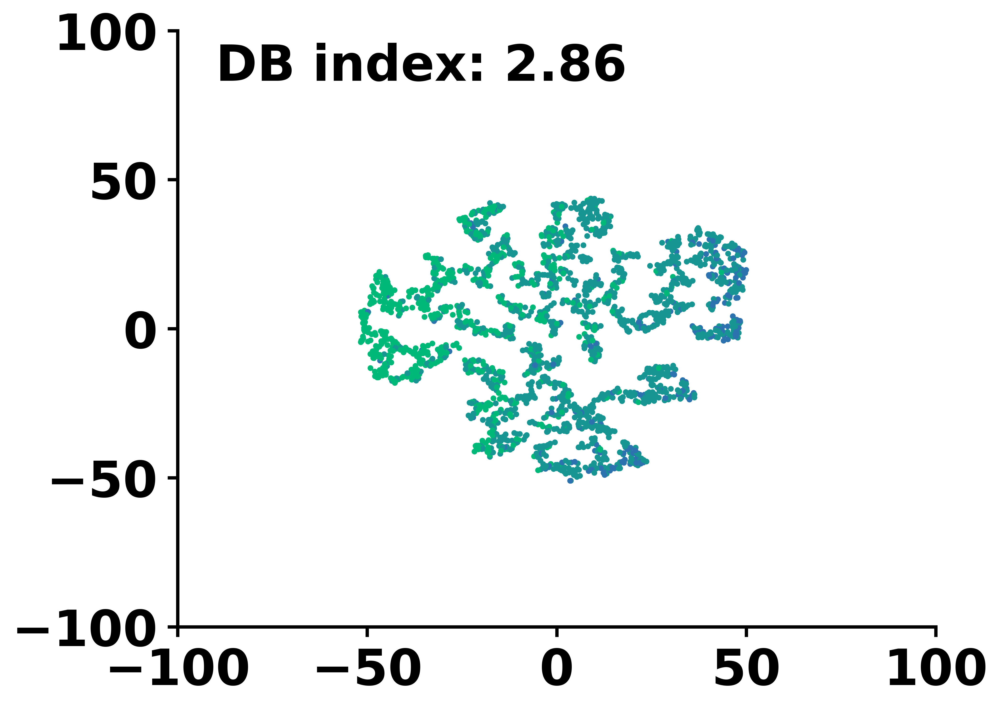

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.metrics import davies_bouldin_score

# ========== 1. 载入 T+G 后期融合 embedding + row_id ==========

ROOT_MULTI = "/root/Invertebrates_EC50_multi_fusion"   # 项目根目录
LATE_DIR   = f"{ROOT_MULTI}/late_fusion_pairs/T_G"    # 👈 改成你这个文件夹的真实路径

X_train_late = np.load(f"{LATE_DIR}/late_T_G_emb_train.npy")
X_test_late  = np.load(f"{LATE_DIR}/late_T_G_emb_test.npy")

rowid_train  = np.load(f"{LATE_DIR}/late_T_G_train_idx.npy")  # df 行号
rowid_test   = np.load(f"{LATE_DIR}/late_T_G_test_idx.npy")

X_all_late   = np.vstack([X_train_late, X_test_late])
rowid_all    = np.concatenate([rowid_train, rowid_test])

print("X_all_late 形状:", X_all_late.shape)
print("rowid_all 形状:", rowid_all.shape)

# ========== 2. 从原始 df 里按 rowid 对齐 mgperL，并生成标签 ==========

df = pd.read_excel("/root/fusion_dataset/Invertebrates_EC50_unique.xlsx")
df = df.dropna().reset_index(drop=True)

mgperL_raw = df.loc[rowid_all, "mgperL"].values
mgperL_log = np.log1p(mgperL_raw)   # 跟前面所有 DBI 保持一致：log1p(mg/L)

def generate_labels(mg):
    # mg 是 log1p(mg/L)，阈值仍然用 1 / 5 / 50
    if mg < 1.0:
        return 0  # high
    elif 1.0 <= mg < 5.0:
        return 1  # mid
    elif 5.0 <= mg < 50.0:
        return 2  # mid
    else:
        return 3  # low

classification_labels = np.array(
    [generate_labels(mg) for mg in mgperL_log],
    dtype=int
)

assert X_all_late.shape[0] == len(classification_labels), "特征与标签长度不一致，检查 rowid 对齐！"

# ========== 3. t-SNE 降维 ==========
tsne = TSNE(
    n_components=2,
    random_state=42,
    perplexity=30,
    max_iter=1000
)
tsne_result = tsne.fit_transform(X_all_late)

# ========== 4. DBI（t-SNE 2D 空间）==========
dbi_tsne = davies_bouldin_score(tsne_result, classification_labels)
print(f"[T+G 后期融合] t-SNE 2D 空间 DB index: {dbi_tsne:.4f}")

# ========== 5. 绘图 ==========
custom_palette = {
    0: "#00B877",  # Jade  — 明亮的绿色
    1: "#169593",  # Dark Cyan — 深青色
    2: "#2C72AF",  # Bice Blue — 中蓝色
    3: "#6D4389",  # Eminence — 紫罗兰色 
}

fig, ax = plt.subplots(figsize=(9, 7), dpi=500)

sns.scatterplot(
    x=tsne_result[:, 0],
    y=tsne_result[:, 1],
    hue=classification_labels,
    palette=custom_palette,
    s=12,
    edgecolor=None,
    linewidth=0,
    ax=ax
)

# DBI 标注：小一点 + 顶部留白后更舒服
ax.text(
    0.05, 0.98,
    f"DB index: {dbi_tsne:.2f}",
    transform=ax.transAxes,
    fontsize=30, fontweight='bold', va='top'
)

ax.legend([], [], frameon=False)

# 关键：刻度别那么大，同时加一点 padding
ax.set_xticks([-100, -50, 0, 50, 100])
ax.set_yticks([-100, -50, 0, 50, 100])
ax.tick_params(axis='both', labelsize=30, width=2, length=6, pad=6)

for t in ax.get_xticklabels() + ax.get_yticklabels():
    t.set_fontweight('bold')

sns.despine(top=True, right=True, ax=ax)
ax.spines['left'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)

# 关键：不要用 tight_layout 把顶部挤爆，给标题留条“天窗”
plt.tight_layout(rect=[0.06, 0.06, 1.00, 0.92])
plt.show()


X_all_late 形状: (2264, 2)
rowid_all 形状: (2264,)
[T+P 后期融合] t-SNE 2D 空间 DB index: 2.9974


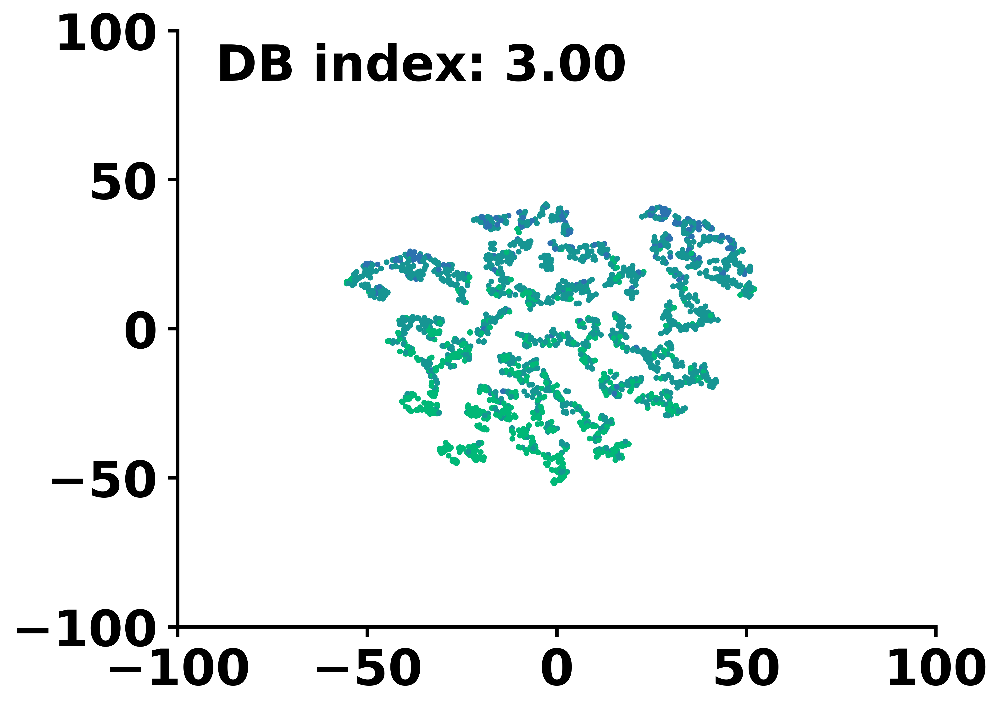

In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.metrics import davies_bouldin_score

# ========== 1. 载入 T+P 后期融合 embedding + row_id ==========

ROOT_MULTI = "/root/Invertebrates_EC50_multi_fusion"   # 按你的实际根目录改
LATE_DIR   = f"{ROOT_MULTI}/late_fusion_pairs/T_P"    # ⇐ 改成存放上面这些文件的真实文件夹

X_train_late = np.load(f"{LATE_DIR}/late_T_P_emb_train.npy")
X_test_late  = np.load(f"{LATE_DIR}/late_T_P_emb_test.npy")

rowid_train  = np.load(f"{LATE_DIR}/late_T_P_train_idx.npy")  # df 行号
rowid_test   = np.load(f"{LATE_DIR}/late_T_P_test_idx.npy")

X_all_late   = np.vstack([X_train_late, X_test_late])
rowid_all    = np.concatenate([rowid_train, rowid_test])

print("X_all_late 形状:", X_all_late.shape)
print("rowid_all 形状:", rowid_all.shape)

# ========== 2. 用 rowid 从原始 df 里取 mgperL，并生成分档标签 ==========

df = pd.read_excel("/root/fusion_dataset/Invertebrates_EC50_unique.xlsx")
df = df.dropna().reset_index(drop=True)

mgperL_raw = df.loc[rowid_all, "mgperL"].values
mgperL_log = np.log1p(mgperL_raw)   # 和前面所有 DBI 统一：log1p(mg/L)

def generate_labels(mg):
    # mg 是 log1p(mg/L)，阈值仍用 1 / 5 / 50
    if mg < 1.0:
        return 0  # high
    elif 1.0 <= mg < 5.0:
        return 1  # mid
    elif 5.0 <= mg < 50.0:
        return 2  # mid
    else:
        return 3  # low

classification_labels = np.array(
    [generate_labels(mg) for mg in mgperL_log],
    dtype=int
)

assert X_all_late.shape[0] == len(classification_labels), "特征与标签长度不一致，检查 rowid 对齐！"

# ========== 3. t-SNE 降维 ==========
tsne = TSNE(
    n_components=2,
    random_state=42,
    perplexity=30,
    max_iter=1000
)
tsne_result = tsne.fit_transform(X_all_late)

# ========== 4. 在 t-SNE 2D 空间里计算 DBI ==========
dbi_tsne = davies_bouldin_score(tsne_result, classification_labels)
print(f"[T+P 后期融合] t-SNE 2D 空间 DB index: {dbi_tsne:.4f}")

# ========== 5. 绘图 ==========
custom_palette = {
    0: "#00B877",  # Jade  — 明亮的绿色
    1: "#169593",  # Dark Cyan — 深青色
    2: "#2C72AF",  # Bice Blue — 中蓝色
    3: "#6D4389",  # Eminence — 紫罗兰色 
}

fig, ax = plt.subplots(figsize=(9, 7), dpi=500)

sns.scatterplot(
    x=tsne_result[:, 0],
    y=tsne_result[:, 1],
    hue=classification_labels,
    palette=custom_palette,
    s=12,
    edgecolor=None,
    linewidth=0,
    ax=ax
)

# DBI 标注：小一点 + 顶部留白后更舒服
ax.text(
    0.05, 0.98,
    f"DB index: {dbi_tsne:.2f}",
    transform=ax.transAxes,
    fontsize=30, fontweight='bold', va='top'
)

ax.legend([], [], frameon=False)

# 关键：刻度别那么大，同时加一点 padding
ax.set_xticks([-100, -50, 0, 50, 100])
ax.set_yticks([-100, -50, 0, 50, 100])
ax.tick_params(axis='both', labelsize=30, width=2, length=6, pad=6)

for t in ax.get_xticklabels() + ax.get_yticklabels():
    t.set_fontweight('bold')

sns.despine(top=True, right=True, ax=ax)
ax.spines['left'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)

# 关键：不要用 tight_layout 把顶部挤爆，给标题留条“天窗”
plt.tight_layout(rect=[0.06, 0.06, 1.00, 0.92])
plt.show()


X_all_late 形状: (2140, 2)
rowid_all 形状: (2140,)
[T+P 后期融合] t-SNE 2D 空间 DB index: 52.5883


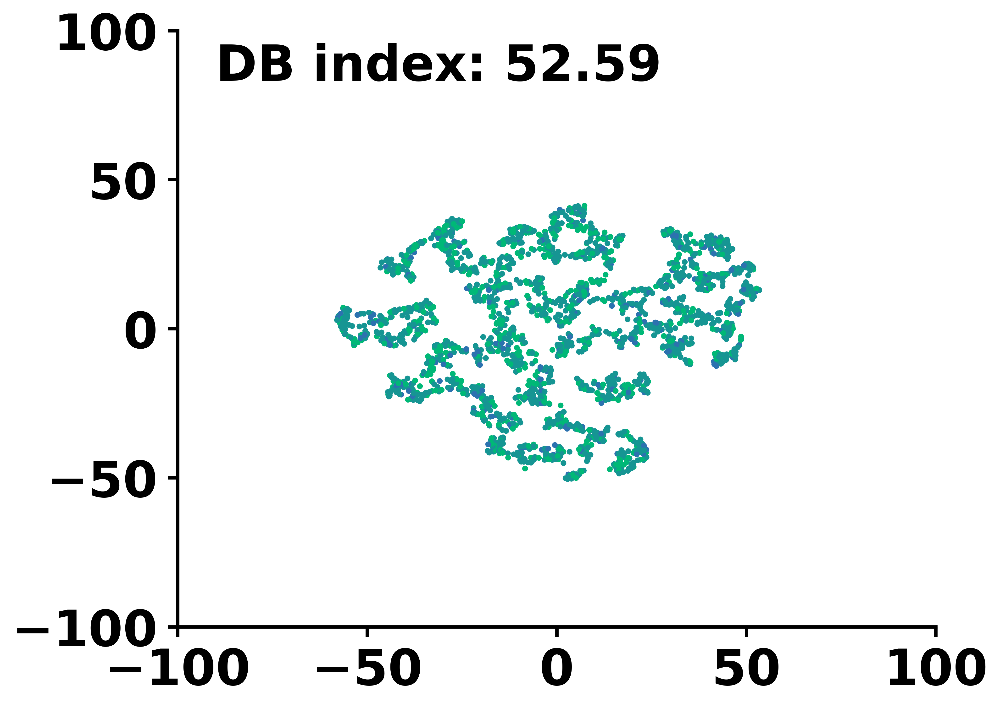

In [14]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.metrics import davies_bouldin_score

# ========== 1. 载入 G+P 后期融合 embedding + row_id ==========

ROOT_MULTI = "/root/Invertebrates_EC50_multi_fusion"   # 按你的实际根目录改
LATE_DIR   = f"{ROOT_MULTI}/late_fusion_pairs/G_P"    # ⇐ 改成存放上面这些文件的真实文件夹

X_train_late = np.load(f"{LATE_DIR}/late_G_P_emb_train.npy")
X_test_late  = np.load(f"{LATE_DIR}/late_G_P_emb_test.npy")

rowid_train  = np.load(f"{LATE_DIR}/late_G_P_train_idx.npy")  # df 行号
rowid_test   = np.load(f"{LATE_DIR}/late_G_P_test_idx.npy")

X_all_late   = np.vstack([X_train_late, X_test_late])
rowid_all    = np.concatenate([rowid_train, rowid_test])

print("X_all_late 形状:", X_all_late.shape)
print("rowid_all 形状:", rowid_all.shape)

# ========== 2. 用 rowid 从原始 df 里取 mgperL，并生成分档标签 ==========

df = pd.read_excel("/root/fusion_dataset/Invertebrates_EC50_unique.xlsx")
df = df.dropna().reset_index(drop=True)

mgperL_raw = df.loc[rowid_all, "mgperL"].values
mgperL_log = np.log1p(mgperL_raw)   # 和前面所有 DBI 统一：log1p(mg/L)

def generate_labels(mg):
    # mg 是 log1p(mg/L)，阈值仍用 1 / 5 / 50
    if mg < 1.0:
        return 0  # high
    elif 1.0 <= mg < 5.0:
        return 1  # mid
    elif 5.0 <= mg < 50.0:
        return 2  # mid
    else:
        return 3  # low

classification_labels = np.array(
    [generate_labels(mg) for mg in mgperL_log],
    dtype=int
)

assert X_all_late.shape[0] == len(classification_labels), "特征与标签长度不一致，检查 rowid 对齐！"

# ========== 3. t-SNE 降维 ==========
tsne = TSNE(
    n_components=2,
    random_state=42,
    perplexity=30,
    max_iter=1000
)
tsne_result = tsne.fit_transform(X_all_late)

# ========== 4. 在 t-SNE 2D 空间里计算 DBI ==========
dbi_tsne = davies_bouldin_score(tsne_result, classification_labels)
print(f"[T+P 后期融合] t-SNE 2D 空间 DB index: {dbi_tsne:.4f}")

# ========== 5. 绘图 ==========
custom_palette = {
    0: "#00B877",  # Jade  — 明亮的绿色
    1: "#169593",  # Dark Cyan — 深青色
    2: "#2C72AF",  # Bice Blue — 中蓝色
    3: "#6D4389",  # Eminence — 紫罗兰色 
}

fig, ax = plt.subplots(figsize=(9, 7), dpi=500)

sns.scatterplot(
    x=tsne_result[:, 0],
    y=tsne_result[:, 1],
    hue=classification_labels,
    palette=custom_palette,
    s=12,
    edgecolor=None,
    linewidth=0,
    ax=ax
)

# DBI 标注：小一点 + 顶部留白后更舒服
ax.text(
    0.05, 0.98,
    f"DB index: {dbi_tsne:.2f}",
    transform=ax.transAxes,
    fontsize=30, fontweight='bold', va='top'
)

ax.legend([], [], frameon=False)

# 关键：刻度别那么大，同时加一点 padding
ax.set_xticks([-100, -50, 0, 50, 100])
ax.set_yticks([-100, -50, 0, 50, 100])
ax.tick_params(axis='both', labelsize=30, width=2, length=6, pad=6)

for t in ax.get_xticklabels() + ax.get_yticklabels():
    t.set_fontweight('bold')

sns.despine(top=True, right=True, ax=ax)
ax.spines['left'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)

# 关键：不要用 tight_layout 把顶部挤爆，给标题留条“天窗”
plt.tight_layout(rect=[0.06, 0.06, 1.00, 0.92])
plt.show()


X_all_late 形状: (1637, 3)
rowid_all 形状: (1637,)
[T+G+P 后期融合] t-SNE 2D 空间 DB index: 3.4848


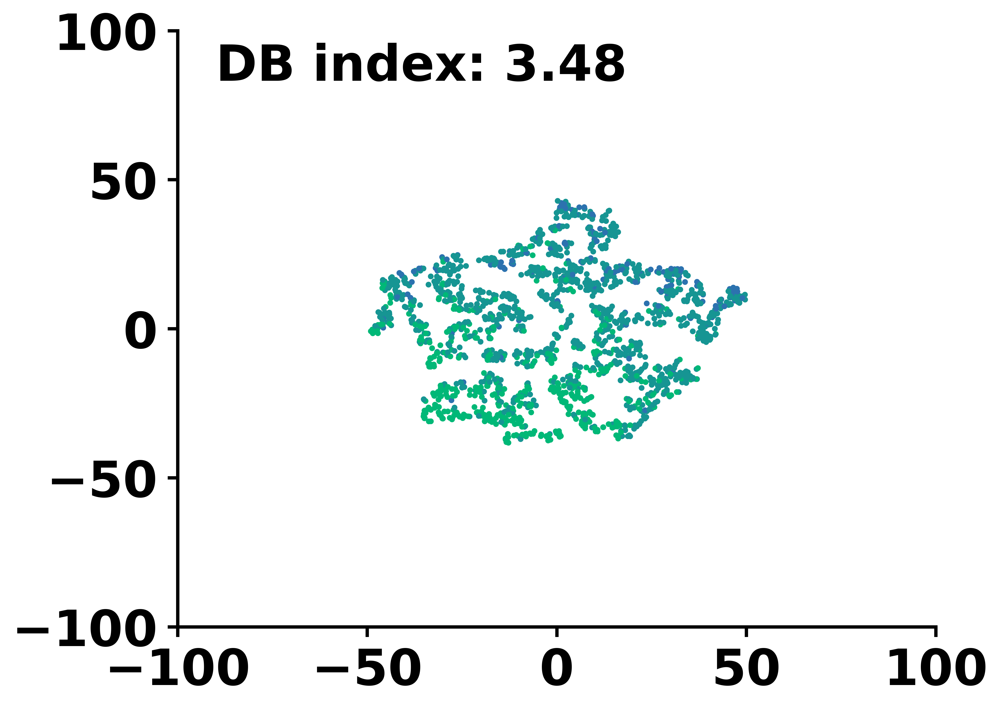

In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.metrics import davies_bouldin_score

# ========== 1. 载入 TGP 后期融合 embedding + row_id ==========

ROOT_MULTI = "/root/Invertebrates_EC50_multi_fusion"        # 项目根目录按需改
LATE_DIR   = f"{ROOT_MULTI}/late_fusion_TGP"        # 就是你截图里的这个文件夹

X_train_late = np.load(f"{LATE_DIR}/late_TGP_emb_train.npy")
X_test_late  = np.load(f"{LATE_DIR}/late_TGP_emb_test.npy")

rowid_train  = np.load(f"{LATE_DIR}/late_TGP_train_idx.npy")   # 这里是 df 行号
rowid_test   = np.load(f"{LATE_DIR}/late_TGP_test_idx.npy")

X_all_late   = np.vstack([X_train_late, X_test_late])
rowid_all    = np.concatenate([rowid_train, rowid_test])

print("X_all_late 形状:", X_all_late.shape)
print("rowid_all 形状:", rowid_all.shape)

# ========== 2. 用 rowid 从原始 df 取 mgperL，并生成四档标签 ==========

df = pd.read_excel("/root/fusion_dataset/Invertebrates_EC50_unique.xlsx")
df = df.dropna().reset_index(drop=True)

mgperL_raw = df.loc[rowid_all, "mgperL"].values
mgperL_log = np.log1p(mgperL_raw)     # 和前面所有 DBI 统一：log1p(mg/L)

def generate_labels(mg):
    # mg 是 log1p(mg/L)，阈值仍用 1 / 5 / 50
    if mg < 1.0:
        return 0     # <1
    elif 1.0 <= mg < 5.0:
        return 1     # [1,5)
    elif 5.0 <= mg < 50.0:
        return 2     # [5,50)
    else:
        return 3     # ≥50

classification_labels = np.array(
    [generate_labels(mg) for mg in mgperL_log],
    dtype=int
)

assert X_all_late.shape[0] == len(classification_labels), "特征与标签长度不一致，检查 rowid 对齐！"

# ========== 3. t-SNE 降维 ==========
tsne = TSNE(
    n_components=2,
    random_state=42,
    perplexity=30,
    max_iter=1000
)
tsne_result = tsne.fit_transform(X_all_late)

# ========== 4. 在 t-SNE 空间计算 DBI ==========
dbi_tsne = davies_bouldin_score(tsne_result, classification_labels)
print(f"[T+G+P 后期融合] t-SNE 2D 空间 DB index: {dbi_tsne:.4f}")

# ========== 5. 画图 ==========
custom_palette = {
    0: "#00B877",  # Jade  — 明亮的绿色
    1: "#169593",  # Dark Cyan — 深青色
    2: "#2C72AF",  # Bice Blue — 中蓝色
    3: "#6D4389",  # Eminence — 紫罗兰色 
}

fig, ax = plt.subplots(figsize=(9, 7), dpi=500)

sns.scatterplot(
    x=tsne_result[:, 0],
    y=tsne_result[:, 1],
    hue=classification_labels,
    palette=custom_palette,
    s=12,
    edgecolor=None,
    linewidth=0,
    ax=ax
)

# DBI 标注：小一点 + 顶部留白后更舒服
ax.text(
    0.05, 0.98,
    f"DB index: {dbi_tsne:.2f}",
    transform=ax.transAxes,
    fontsize=30, fontweight='bold', va='top'
)

ax.legend([], [], frameon=False)

# 关键：刻度别那么大，同时加一点 padding
ax.set_xticks([-100, -50, 0, 50, 100])
ax.set_yticks([-100, -50, 0, 50, 100])
ax.tick_params(axis='both', labelsize=30, width=2, length=6, pad=6)

for t in ax.get_xticklabels() + ax.get_yticklabels():
    t.set_fontweight('bold')

sns.despine(top=True, right=True, ax=ax)
ax.spines['left'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)

# 关键：不要用 tight_layout 把顶部挤爆，给标题留条“天窗”
plt.tight_layout(rect=[0.06, 0.06, 1.00, 0.92])
plt.show()
